#### 1) ERA Interim Q700 anomaly maps for each WT using 12Z initial 24 hr forecast 
 - 1.1) calculate Q700 climatology
 - 1.2) Q700 anomalies of WTs
 - 1.3) Q700anomaly maps for each WT
#### 2) Q700 Seasonal Anomaly
- 2.1) Seasonal Climatology
- 2.2 Seasonal Anomaly

Ming Ge Oct 2024

In [6]:
import datetime 
import calendar
import numpy as np
import pandas as pd
import xarray as xr
import cfgrib
import matplotlib.pyplot as plt
import glob 
import os.path
import cartopy 
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# inorder to import my pathon module, add
# $PYTHONPATH for jupyter for module
sys.path.append("/glade/u/home/mingge/PYTHON")

import coexist_func
from importlib import reload
reload(coexist_func)
from coexist_func import plot_prec_12_erai
from coexist_func import cal_prec_cli_erai, cal_msl_cli_erai
from coexist_func import cal_prec_ano_erai, cal_msl_ano_erai
from coexist_func import cal_season_cli_erai_prec, cal_season_cli_erai_msl
from coexist_func import cal_season_ano_erai_prec, cal_season_ano_erai_msl
from coexist_func import plot_prec_12

#### 0 setups

In [7]:
var_s = 'q700' ## 'MSL'
dir_erai_grib = '/gpfs/fs1/collections/rda/data/ds627.0/ei.oper.fc.sfc/'
# preprocessed with NCL code (from 12Z init and 24 hour fcst)
# so it shift one day for real time
dir_erai = '/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/'+var_s.upper()+'/'
dir_wt = '/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/WT/'

# centroid_ana.ibynb, wt_hist_smyle_era5.ipynb
# to read domain info
sCentroids = '/glade/u/home/mingge/WTing_existing-centroids/CONUS-WTs_existing_centroids.npz'
DATA = np.load(sCentroids)
rgrCentroids = DATA['rgrCentroids']               # (12, 3, 24, 74)
rgiWTs = range(1, rgrCentroids.shape[0]+1, 1)     # number of WT 

lat_s = DATA['rgrLatWT'].min() - 6
lat_e = DATA['rgrLatWT'].max() + 2
lon_s = DATA['rgrLonWT'].min() + 360 
lon_e = DATA['rgrLonWT'].max() + 6 + 360
print('lat:', lat_s , '-', lat_e, 'lon:', lon_s, '-', lon_e)

season_dict = {
    'DJF': [12,1,2],
    'MAM': [3,4,5],
    'JJA': [6,7,8],
    'SON': [9,10,11],
    'JAS': [7,8,9]}

year_s = 1979
year_e = 2014
n_year = year_e - year_s + 1

n_wt = 12


lat: 24.75 - 50.0 lon: 234.75 - 295.5


- 1.1) Climatology calculation

In [13]:
flnm_o = dir_erai + var_s + '_clim_' + str(year_s) + '-' + str(year_e) + '.nc'
prec_cli = cal_msl_cli_erai(dir_erai, year_s, year_e, lat_s, lat_e, lon_s, lon_e, flnm_o, var_s)

/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/Q700/q700_clim_1979-2014.nc exist


- 1.2) anomalies of WTs

In [14]:
flnm_o = dir_erai + var_s + '_ano.nc'
prec_xr = cal_msl_ano_erai(dir_erai, dir_wt,  year_s, year_e, lat_s, lat_e, lon_s, lon_e, prec_cli, flnm_o, var_s)

/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/Q700/q700_ano.nc exist


- 1.3) ensemble average anomaly maps for each WT

In [15]:
with xr.open_dataset(flnm_o) as ds:
    prec_xr = ds.__xarray_dataarray_variable__

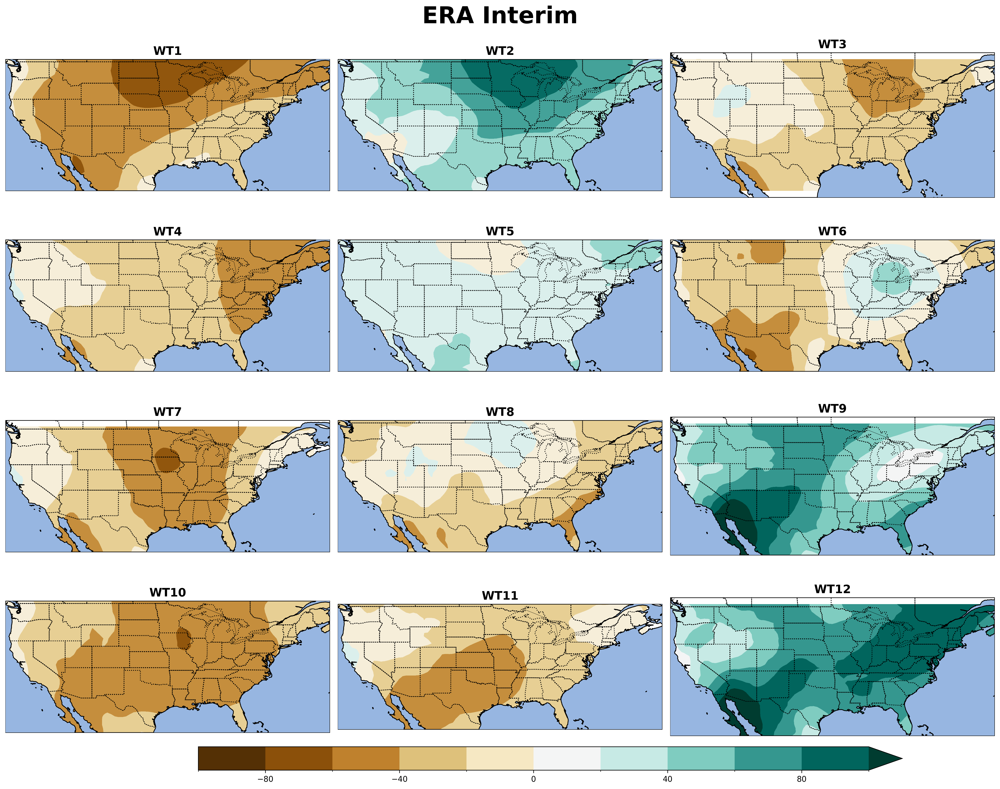

In [16]:
plot_prec_12_erai(prec_xr, -100, 100, 11, 'BrBG', 'horizontal', 'ERA Interim') 

#### 2) Seasonal Anomaly

- 2.1) Seasonal Climatology

In [8]:
flnm_cli = dir_erai + var_s + '_seasonal_cli.nc'
prec_cli_xr = cal_season_cli_erai_msl(var_s, dir_erai, season_dict, year_s, year_e,lat_s, lat_e, lon_s, lon_e, flnm_cli)

/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/Q700/q700_seasonal_cli.nc exist
FrozenMappingWarningOnValuesAccess({'latitude': 36, 'longitude': 87, 'season': 4})


- 2.2) Seasonal Anomaly of weather types

In [9]:
flnm_o = dir_erai + var_s + '_seasonal_ano.nc'
prec_wt = cal_season_ano_erai_msl(var_s, dir_erai, dir_wt, season_dict, year_s, year_e, flnm_cli, flnm_o)

/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/Q700/q700_seasonal_ano.nc exist


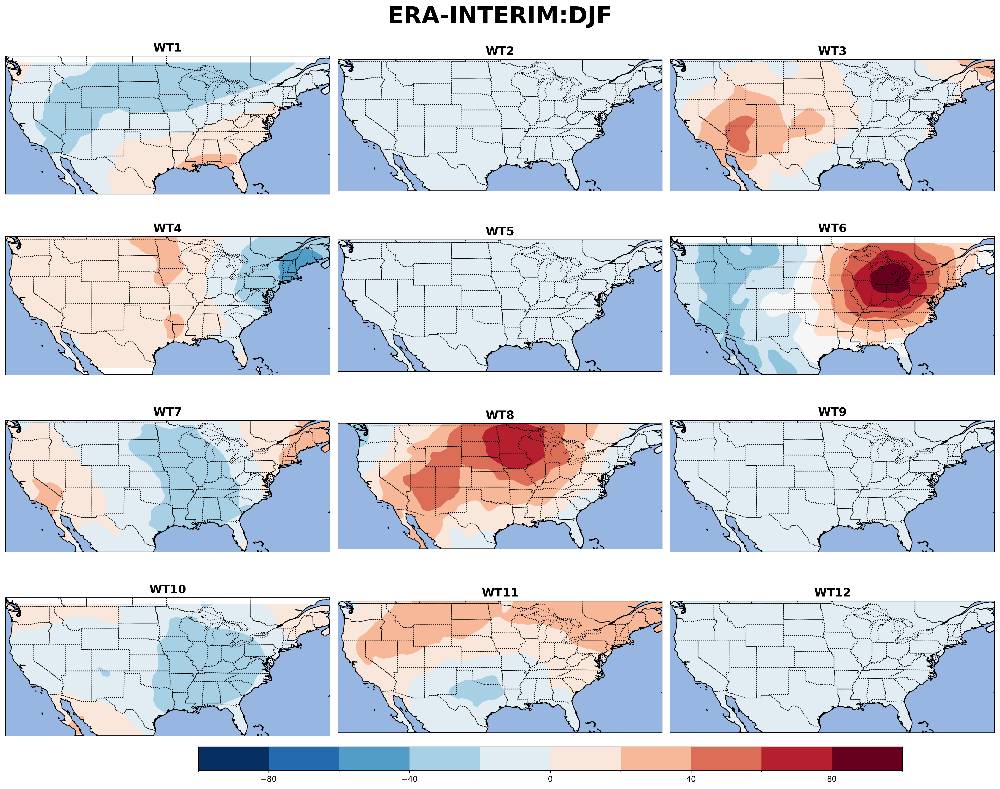

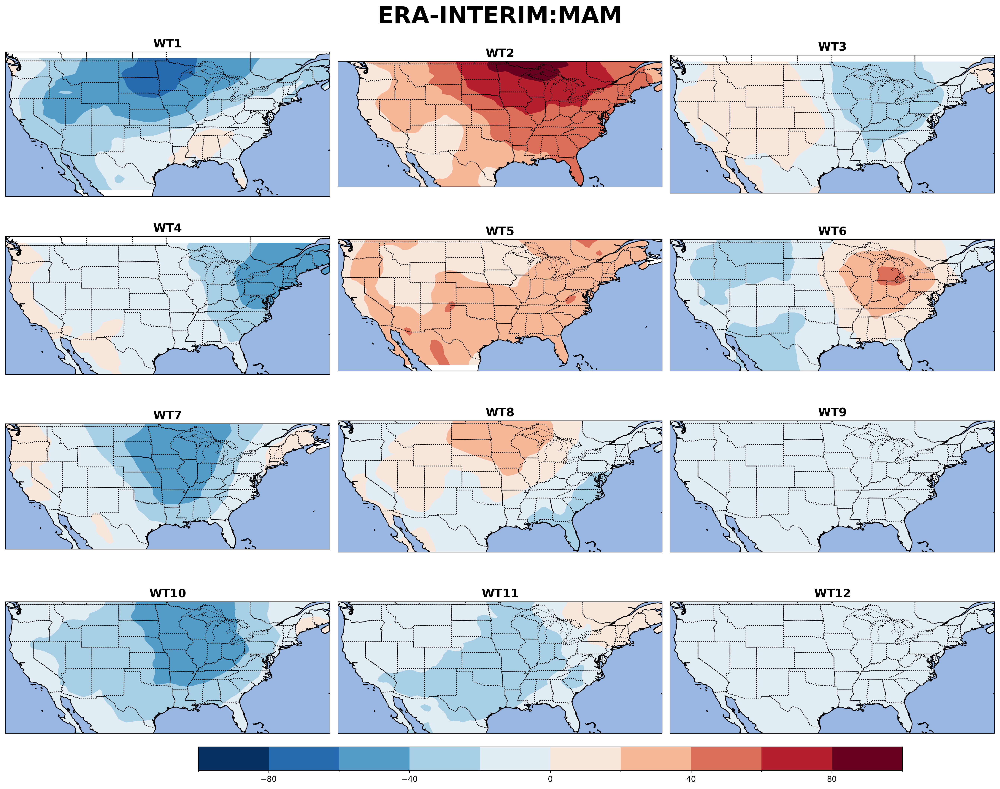

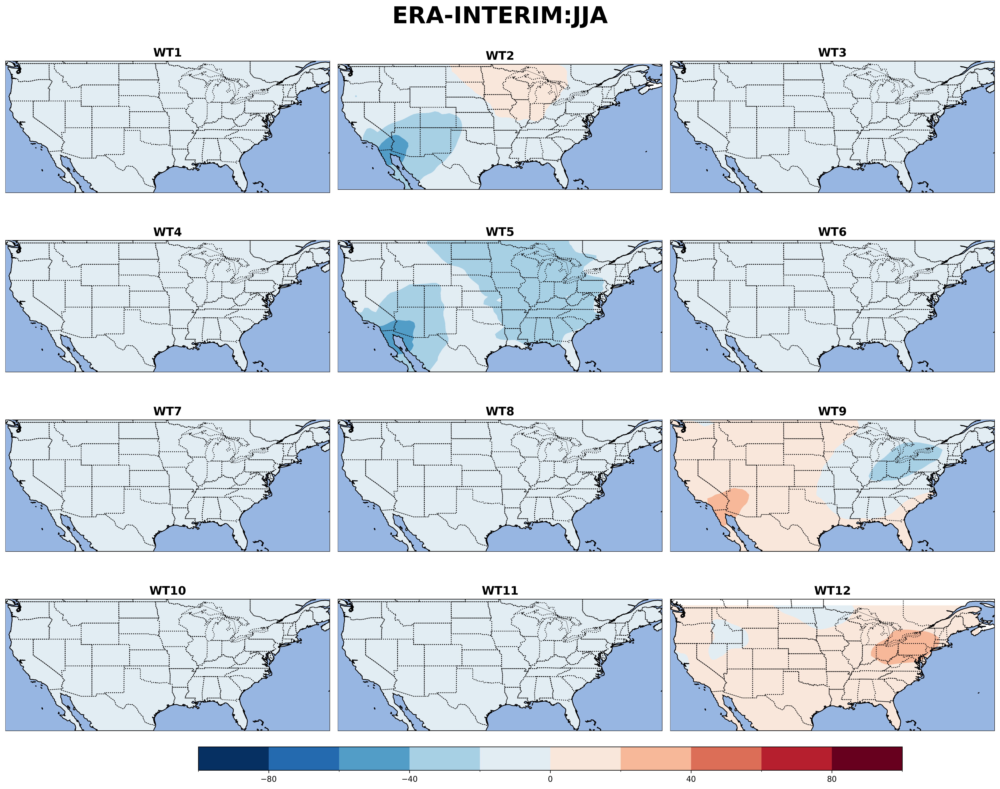

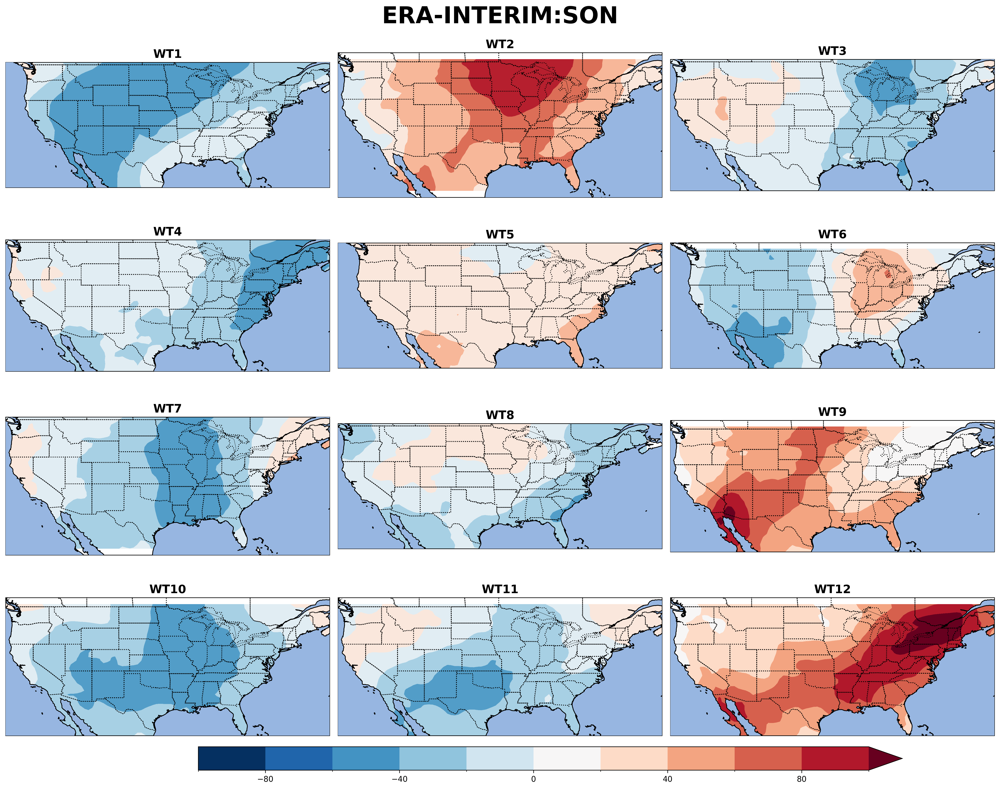

In [10]:
season_s = ['DJF','MAM','JJA','SON']            

for ns in range(4):
    plot_prec_12_erai(prec_wt[:,ns]*100, -100, 100, 11, 'RdBu_r', 'horizontal', 'ERA-INTERIM:' + season_s[ns]);